In [1]:
import torch
import os
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from diffusion_utils import *
import torch.nn.functional as func
from model import UNETv4, UNETv5
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

In [2]:
# hyperparameters

# diffusion hyperparameters
timesteps = 500
beta1 = 1e-4
beta2 = 0.02

# network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
width = 128
height = 800 # 16x16 image
save_dir = r'.\weights_v4'

# training hyperparameters
batch_size = 4

In [3]:
# construct DDPM noise schedule
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device) + beta1
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp()    
ab_t[0] = 1

In [4]:
input_folder = r'C:\Users\u_imagenes\Documents\smerino\input'
output_folder = r'C:\Users\u_imagenes\Documents\smerino\target_enh'
dataset = CustomDataset(input_folder, output_folder, transform=True)
print(f'Dataset length: {len(dataset)}')
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
x_sample, y_sample = next(iter(train_loader))
print(x_sample.shape)
print(y_sample.shape)

Dataset length: 10000
torch.Size([4, 2, 800, 128])
torch.Size([4, 1, 800, 128])


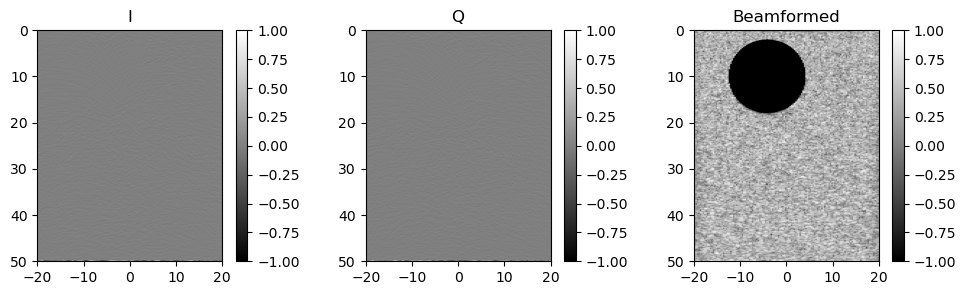

In [5]:
plot_sample(x_sample[1,:,:,:], y_sample[1,:,:,:])

In [6]:
@torch.no_grad()
def sample_ddim(x, step_size, model, device):
    """ sample quickly using DDIM """
    # x_T ~ N(0, 1), sample initial noise
    output_shape = list(x.shape)
    output_shape[1] = 1
    output = torch.randn(output_shape).to(device)
    input_model = torch.cat((x, output), 1)

    step_size = int(step_size)
    # array to keep track of generated steps for plotting
    intermediate = [] 
    for i in range(timesteps, 0, -step_size):
        print(f'sampling timestep {i:3d}', end='\r')
        # reshape time tensor
        t = torch.tensor([i])[:, None, None, None].to(device)
        eps = model(input_model, t)    # predict noise e_(x_t,t)
        output = denoise_ddim(output, ab_t[i], ab_t[i - step_size], eps)
        intermediate.append(output.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return output, intermediate

# Model and normalization

Loaded in Model


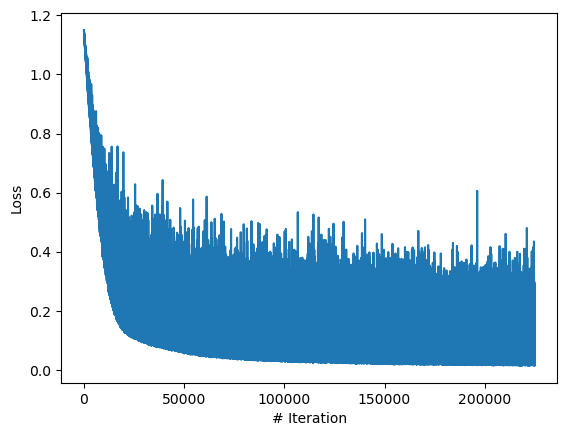

In [7]:
save_dir = r'.\weights'
training_epochs = 180
new_model = UNETv5(in_channels=3, out_channels=1).to(device)
new_model.load_state_dict(torch.load(f"{save_dir}\\model_{training_epochs}.pth", map_location=device))
new_model.eval() 

loss_npy = np.load(f"{save_dir}\\loss_{training_epochs}.npy")
plt.plot(loss_npy)
plt.xlabel('# Iteration')
plt.ylabel('Loss')
# plt.xlim(0,10000)
# plt.ylim(0,1)
print("Loaded in Model")


In [8]:
dataset = CustomDataset(input_folder, output_folder, transform=True)
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
x_sample, y_sample = next(iter(train_loader))
samples_new_10, intermediate_new_10 = sample_ddim(x_sample.to(device), step_size=25, model=new_model, device=device)


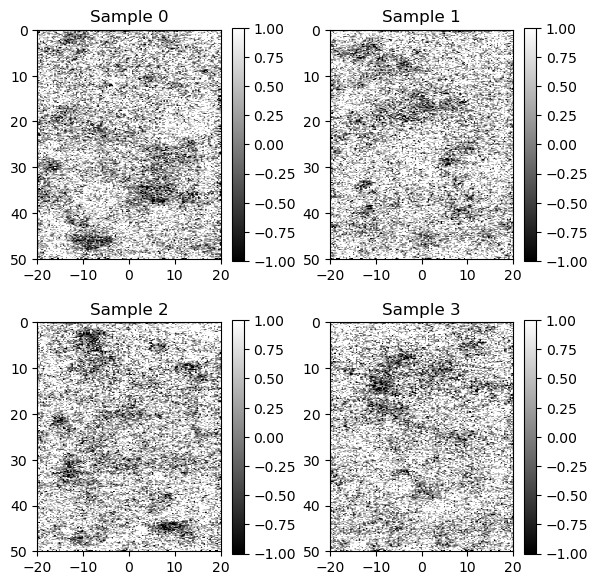

In [9]:
plot_minibatch(samples_new_10.to('cpu'))


In [10]:
animate_reverse_process(intermediate_new_10)


Creating animation...


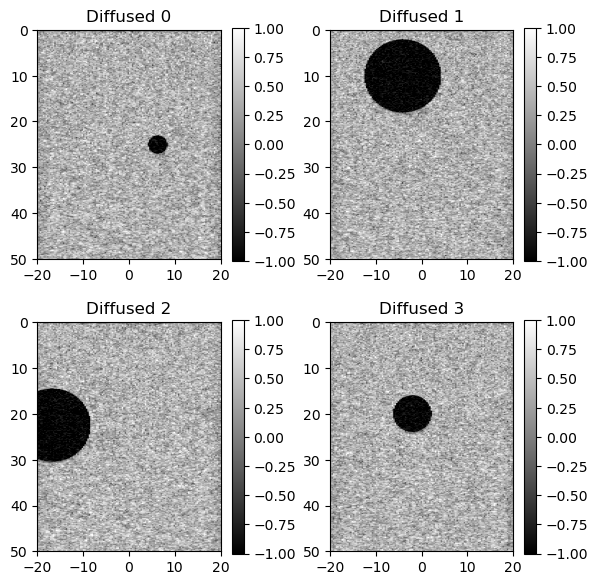

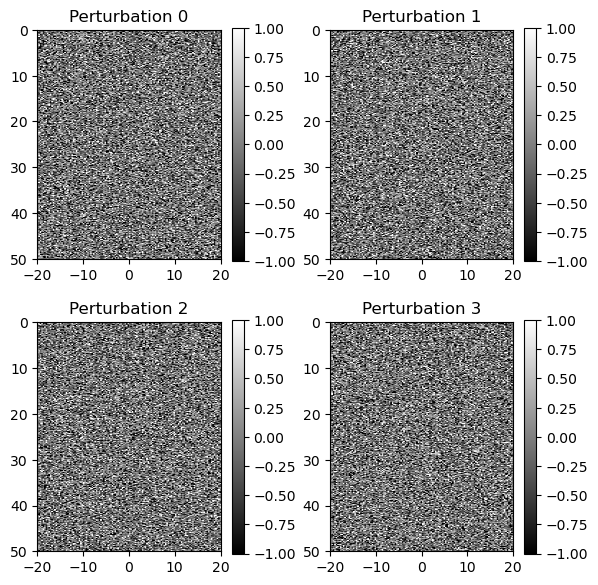

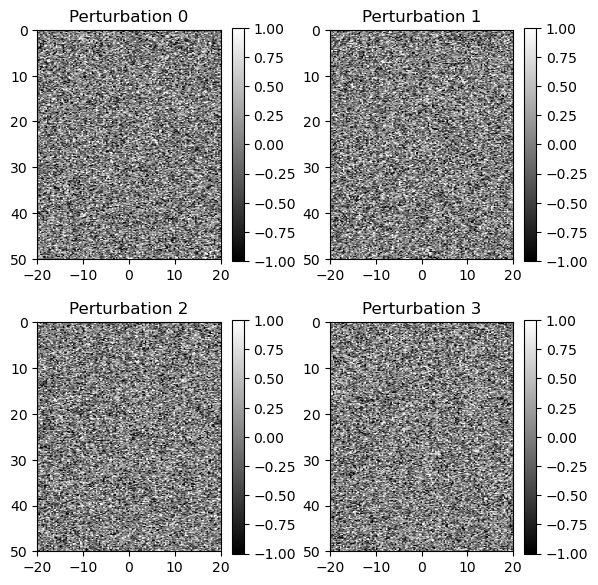

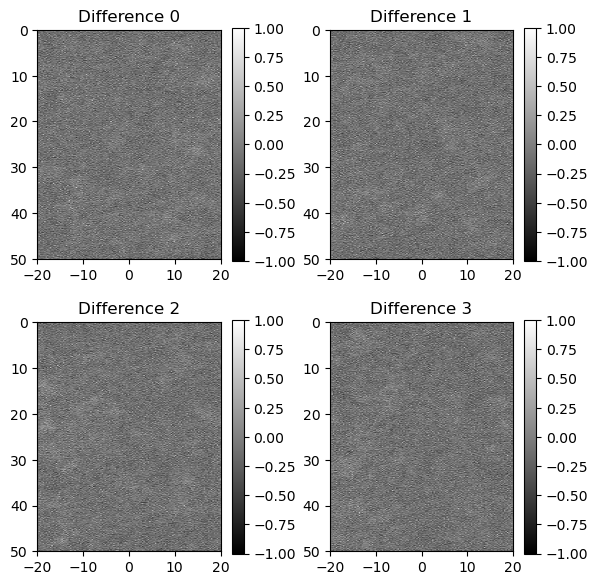

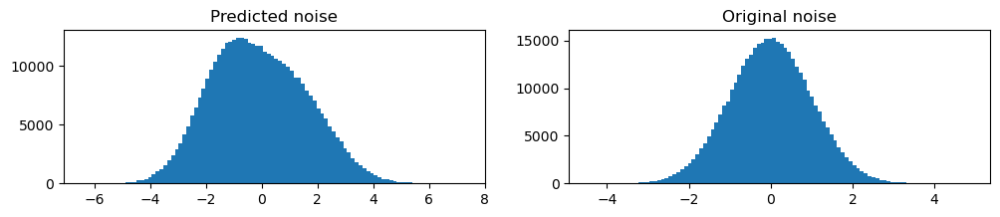

Predicted mean: -0.10687536001205444, std: 1.7034237384796143
Original mean: -0.0025056814774870872, std: 0.999728262424469
MSE: 0.5974011994240449


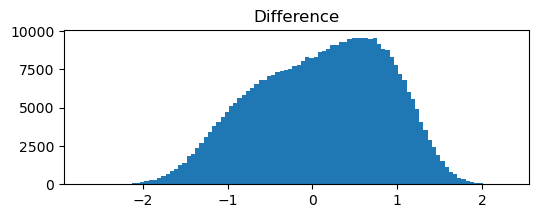

In [11]:
noise_shape = list(x_sample.shape)
noise_shape[1] = 1
noise = torch.randn(noise_shape).to(device)
input_model = torch.cat((x_sample.to(device), noise), 1)

sample_timestep = timesteps//10
t = torch.Tensor([sample_timestep]).int().to(device)
y_pert = perturb_input(y_sample.to(device), ab_t[t], noise)

plot_minibatch(y_pert, title="Diffused")
with torch.inference_mode():
    eps = new_model(input_model, t)
    predicted_noise = eps.reshape((height*width*batch_size,1)).detach().to('cpu').numpy()
    original_noise = noise.reshape((height*width*batch_size,1)).detach().to('cpu').numpy()

plot_minibatch(eps, title="Perturbation")
plot_minibatch(noise, title="Perturbation")
plot_minibatch(eps - noise, title="Difference")
plt.figure(figsize=(12,2))
plt.subplot(121)
plt.hist(predicted_noise,100)
plt.title("Predicted noise")

plt.subplot(122)
plt.hist(original_noise,100)
plt.title("Original noise")
plt.show()


print(f"Predicted mean: {np.mean(predicted_noise)}, std: {np.std(predicted_noise)}")
print(f"Original mean: {np.mean(original_noise)}, std: {np.std(original_noise)}")
print(f"MSE: {np.std(original_noise - predicted_noise)**2}")
plt.figure(figsize=(6,2))
plt.hist(original_noise - predicted_noise,100)
plt.title("Difference")
plt.show()
